<br/>
<img src="images/cd-logo-blue-600x600.png" alt="" width="130px" align="left"/>
<img src="images/cd-logo-blue-600x600.png" alt="" width="130px" align="right"/>
<div align="center">
<h2>Bootcamp Data Science - Módulo 3</h2><br/>
<h1>Reducción de dimensionalidad</h1>
<br/><br/>
    <b>Instructor Principal:</b> Patricio Olivares polivares@codingdojo.cl <br/>
    <b>Instructor Asistente:</b> Jesús Ortiz jortiz@codingdojo.cl<br/><br/>
    <b>Coding Dojo</b>
</div>
<br>
Fuente: "Hands-on Machine Learning with Scikit-Learn, Keras & TensorFlow"

# Reducción de dimensionalidad

- Hasta el momento, hemos visto datasets pequeños, con pocas características (columnas).
- Datasets con un mayor número de columnas son muy comunes. Estos producen:
    - Entrenamientos más lentos
    - Dificultad para encontrar una buena solución
- Es en este contexto donde se plantea la **reducción de dimensionalidad**
- Reducción de dimensionalidad viene acompañada de **pérdida de información** (ej: jpeg)


<img src="images/Webp_Jpeg_Lossless_comparative.png" alt="" width="900px"/>
<br>

Author: Christophe Mehay

# Principal Components Analysis (PCA-Análisis de Componentes Principales)

- Una de las técnicas más populares para reducción de dimensionalidad
- Identifica el hiperplano de mayor varianza respecto a los datos, y luego proyecta los datos en él.
- PCA nos permite:
    - Poder visualizar datos con alta dimensionalidad que de otra forma no sería posible
    - Reducción de dimensionalidad para mejora en la velocidad de entrenamiento
- En PCA, es importante que los datos se encuentren en la misma escala (sino, se debe **escalar**)
- PCA identifica los ejes de mayor varianza (componentes principales)

# Usando PCA para visualización

In [1]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
import pandas as pd

cancer_data = load_breast_cancer(as_frame=True) # Para obtener datos como dataframe
print(cancer_data.target_names) # 0 Maligno, 1 benigno

['malignant' 'benign']


In [2]:
cancer_data.frame.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [3]:
# Cantidad de columnas en nuestro dataset
len(cancer_data.feature_names)

30

In [4]:
df = cancer_data.frame
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


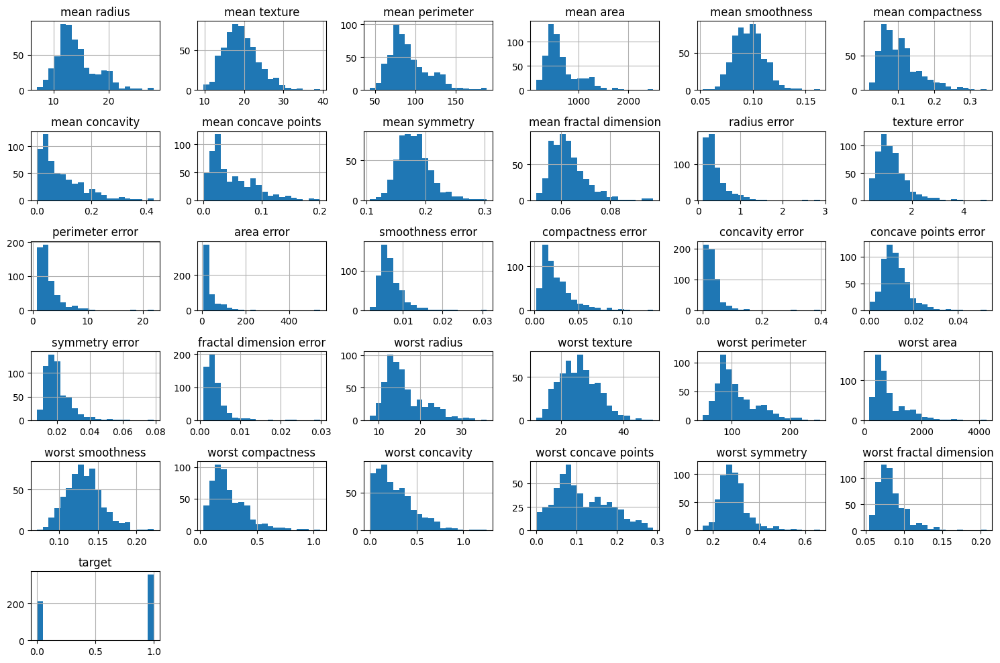

In [5]:
df.hist(bins=20,figsize=(15,10))
plt.tight_layout()
plt.show()

In [6]:
# Acá haremos el tratamiento de PCA sobre nuestro dataset
# Iniciaremos con el escalamiento por estandarización
from sklearn.preprocessing import StandardScaler

X = cancer_data.data
y = cancer_data.target

scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=cancer_data.feature_names)

In [7]:
X.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


Plotting  mean radius  vs  mean texture
Plotting  mean radius  vs  mean perimeter
Plotting  mean radius  vs  mean area
Plotting  mean radius  vs  mean smoothness
Plotting  mean radius  vs  mean compactness
Plotting  mean radius  vs  mean concavity
Plotting  mean radius  vs  mean concave points
Plotting  mean radius  vs  mean symmetry
Plotting  mean radius  vs  mean fractal dimension
Plotting  mean radius  vs  radius error
Plotting  mean radius  vs  texture error
Plotting  mean radius  vs  perimeter error
Plotting  mean radius  vs  area error
Plotting  mean radius  vs  smoothness error
Plotting  mean radius  vs  compactness error
Plotting  mean radius  vs  concavity error
Plotting  mean radius  vs  concave points error
Plotting  mean radius  vs  symmetry error
Plotting  mean radius  vs  fractal dimension error
Plotting  mean radius  vs  worst radius
Plotting  mean radius  vs  worst texture
Plotting  mean radius  vs  worst perimeter
Plotting  mean radius  vs  worst area
Plotting  mean ra

/home/polivares/anaconda3/envs/DataScience/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


Plotting  mean radius  vs  worst concave points
Plotting  mean radius  vs  worst symmetry
Plotting  mean radius  vs  worst fractal dimension
Plotting  mean perimeter  vs  mean texture
Plotting  mean perimeter  vs  mean area
Plotting  mean perimeter  vs  mean smoothness
Plotting  mean perimeter  vs  mean compactness
Plotting  mean perimeter  vs  mean concavity
Plotting  mean perimeter  vs  mean concave points
Plotting  mean perimeter  vs  mean symmetry
Plotting  mean perimeter  vs  mean fractal dimension
Plotting  mean perimeter  vs  radius error
Plotting  mean perimeter  vs  texture error
Plotting  mean perimeter  vs  perimeter error
Plotting  mean perimeter  vs  area error
Plotting  mean perimeter  vs  smoothness error
Plotting  mean perimeter  vs  compactness error
Plotting  mean perimeter  vs  concavity error
Plotting  mean perimeter  vs  concave points error
Plotting  mean perimeter  vs  symmetry error
Plotting  mean perimeter  vs  fractal dimension error
Plotting  mean perimeter  

Plotting  concavity error  vs  mean concave points
Plotting  concavity error  vs  mean fractal dimension
Plotting  concavity error  vs  texture error
Plotting  concavity error  vs  area error
Plotting  concavity error  vs  compactness error
Plotting  concavity error  vs  concave points error
Plotting  concavity error  vs  symmetry error
Plotting  concavity error  vs  fractal dimension error
Plotting  concavity error  vs  worst radius
Plotting  concavity error  vs  worst texture
Plotting  concavity error  vs  worst perimeter
Plotting  concavity error  vs  worst area
Plotting  concavity error  vs  worst smoothness
Plotting  concavity error  vs  worst compactness
Plotting  concavity error  vs  worst concavity
Plotting  concavity error  vs  worst concave points
Plotting  concavity error  vs  worst symmetry
Plotting  concavity error  vs  worst fractal dimension
Plotting  symmetry error  vs  mean texture
Plotting  symmetry error  vs  mean area
Plotting  symmetry error  vs  mean compactness
P

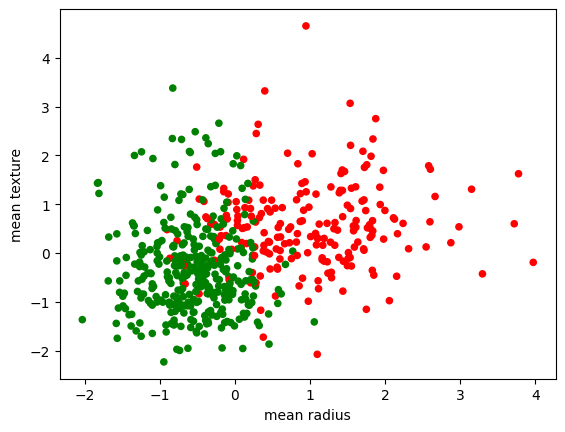

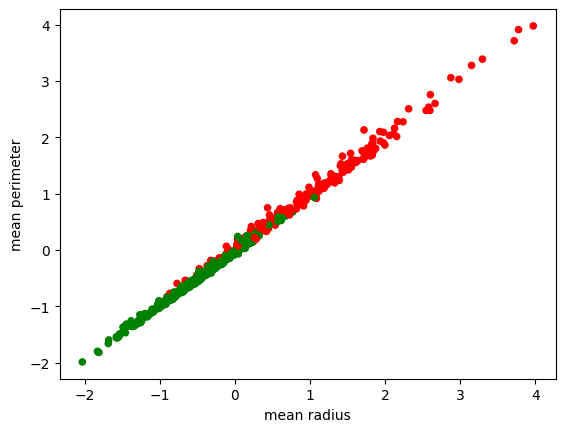

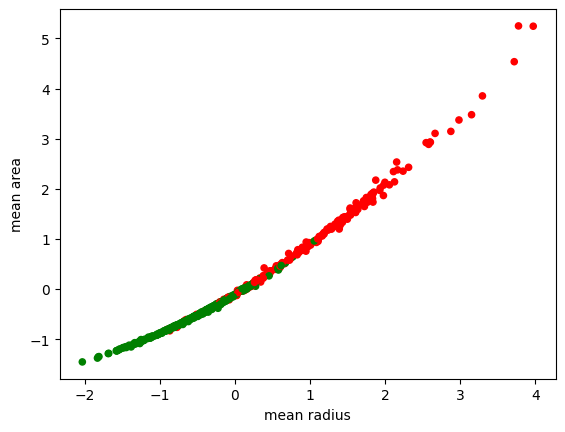

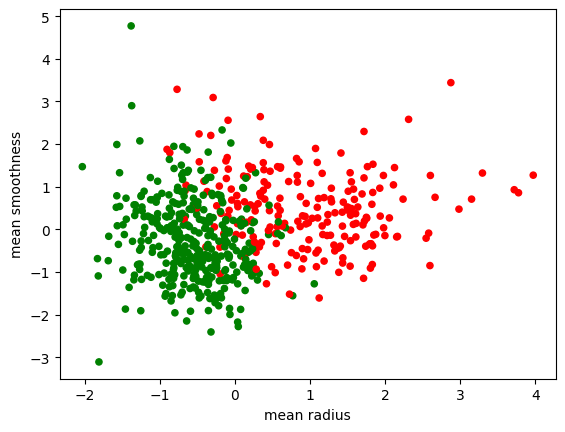

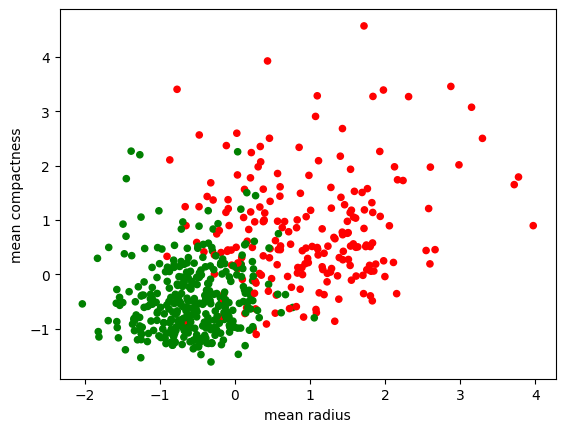

...

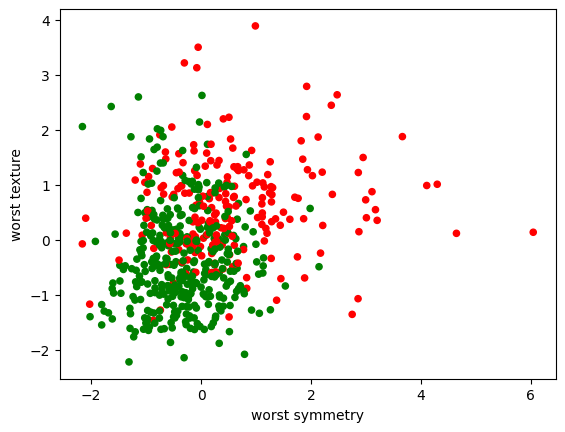

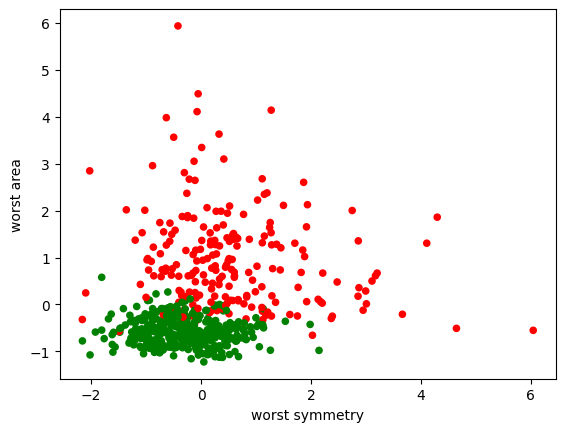

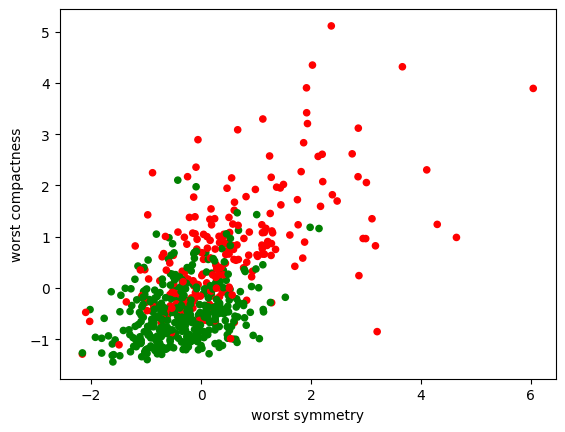

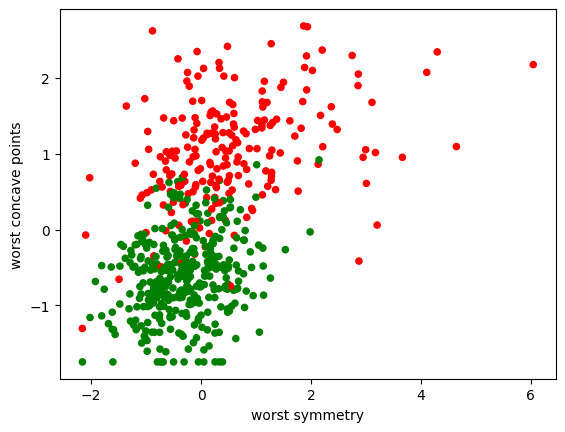

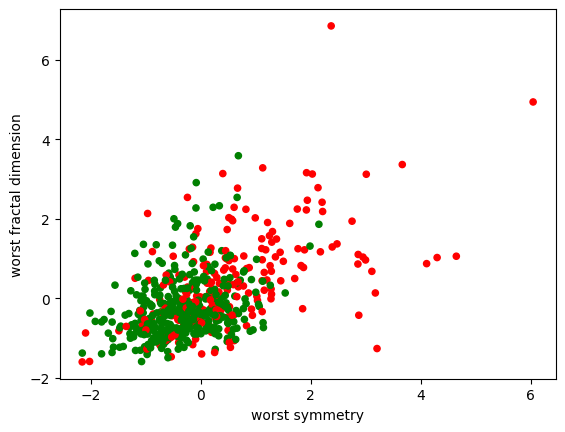

In [8]:
# Todos los gráficos entre pares de columnas!
colors = {0:'red', 1:'green'}
color_map = y.map(colors)
columns = X.columns.tolist()

i = 0 
for x in columns:
    columns.remove(x)
    for y in columns:
        print("Plotting ", x, " vs ", y)
        X.plot.scatter(x=x, y=y, c=color_map)
        i += 1
print("Número de gráficos: ", i)
plt.show()


In [9]:
# Acá utilizaremos PCA
from sklearn.decomposition import PCA

pca = PCA()
#pca.fit(X)
#pca.transform(X)
pcs = pca.fit_transform(X)
print(pcs.shape)
print(X.shape)
# Los datos almacenados en la variables pcs (resultado luego de la transformación PCA), tienen las mismas
# dimensiones que el dataset original. ¿Cuál es nuestra ganancia acá?
# Lo que ocurre es que estas nuevas columnas están ya ordenadas de mayor a menor importancia (o en otras
# palabras, de mayor a menor varianza)

(569, 30)
(569, 30)


In [13]:
pcs_df = pd.DataFrame(pcs)
pcs_df

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411424,2.159370,-0.398407,-0.157118,-0.877402,...,0.096515,0.068850,0.084519,-0.175256,-0.151020,-0.201503,-0.252585,-0.033914,0.045648,-0.047169
1,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028656,0.013358,0.240988,-0.711905,1.106995,...,-0.077327,-0.094578,-0.217718,0.011290,-0.170510,-0.041129,0.181270,0.032624,-0.005687,-0.001868
2,5.733896,-1.075174,-0.551748,0.912083,-0.177086,0.541452,-0.668166,0.097374,0.024066,0.454275,...,0.311067,-0.060309,-0.074291,0.102762,0.171158,0.004735,0.049569,0.047026,0.003146,0.000751
3,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429911,1.059565,-1.405440,-1.116975,...,0.434193,-0.203266,-0.124105,0.153430,0.077496,-0.275225,0.183462,0.042484,-0.069295,-0.019937
4,3.935302,-1.948072,1.389767,2.940639,0.546747,-1.226495,-0.936213,0.636376,-0.263805,0.377704,...,-0.116545,-0.017650,0.139454,-0.005332,0.003062,0.039254,0.032168,-0.034786,0.005038,0.021214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,6.439315,-3.576817,2.459487,1.177314,-0.074824,-2.375193,-0.596130,-0.035471,0.987929,0.256989,...,0.006888,-0.067000,0.088590,0.107898,0.219520,-0.122900,0.159198,0.009853,0.007119,-0.001415
565,3.793382,-3.584048,2.088476,-2.506028,-0.510723,-0.246710,-0.716326,-1.113360,-0.105207,-0.108632,...,-0.009802,0.019563,-0.055405,0.086135,0.001197,0.065889,-0.068512,-0.023575,-0.027486,-0.010419
566,1.256179,-1.902297,0.562731,-2.089227,1.809991,-0.534447,-0.192758,0.341887,0.393917,0.520877,...,-0.036592,0.063352,-0.200312,-0.044819,0.002429,0.007095,-0.023691,-0.002578,0.006706,0.003770
567,10.374794,1.672010,-1.877029,-2.356031,-0.033742,0.567936,0.223082,-0.280239,-0.542035,-0.089296,...,0.140648,-0.042478,0.168820,-0.195969,0.377830,-0.198192,-0.027409,-0.068086,-0.084163,-0.023783


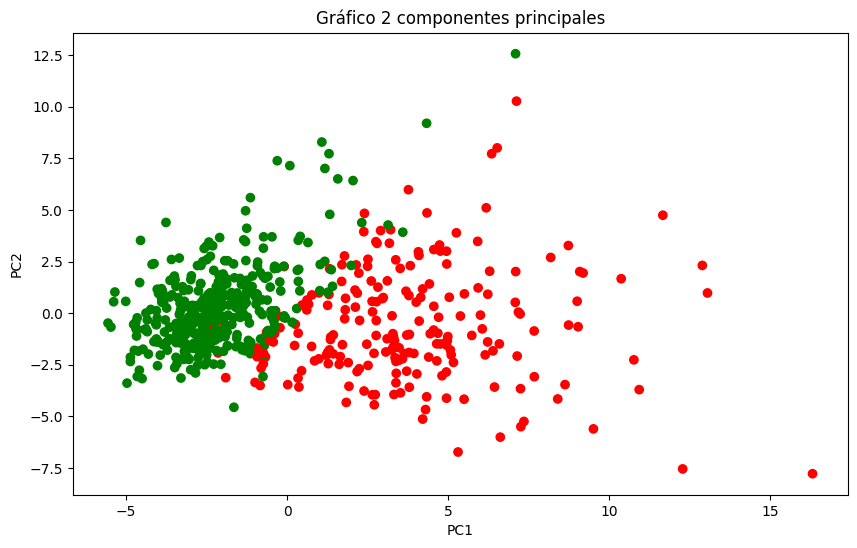

In [10]:

plt.figure(figsize=(10,6))
plt.scatter(pcs[:,0], pcs[:,1], c = color_map)
plt.title('Gráfico 2 componentes principales')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


# Usando PCA para entrenamiento

In [14]:
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


X = cancer_data.data
y = cancer_data.target

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2, stratify=y)

# Instanciar Escalador Estándar
scaler = StandardScaler()
# Ajustar y transformar datos
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [20]:
pca = PCA(n_components=10) # Prueba cambiando el número de componentes!!
X_train_pca = pca.fit_transform(X_train)
X_train_pca_df = pd.DataFrame(X_train_pca)
X_test_pca = pca.transform(X_test)
X_test_pca_df = pd.DataFrame(X_test_pca)

X_train_pca_df

,0,1,2,3,4,5,6,7,8,9
0,-4.167251,0.255512,-0.352313,0.647903,-0.643384,-0.106293,0.185485,-0.256539,0.479964,0.701097
1,4.597260,-0.967634,-0.560218,0.884330,0.033553,-1.118873,-2.119873,0.316206,-0.786681,-0.283672
2,-4.564327,-0.171496,1.506432,0.714315,-1.870137,1.236540,0.230222,-0.117002,-0.742122,-0.309376
3,-0.883693,0.438912,-1.449090,1.957159,-0.007666,0.256157,-0.092612,-0.179583,-0.088296,0.254822
4,-2.951399,0.365633,1.181772,-0.569040,-1.343174,1.911394,-0.511469,-0.391674,-0.244002,-0.049408
...,...,...,...,...,...,...,...,...,...,...
450,-0.358376,-0.987042,-2.491515,-0.846646,0.656542,0.254829,0.699732,0.358714,-0.001240,0.441944
451,6.684054,-1.694821,0.493793,1.169818,-0.122193,-0.977873,1.284275,-0.354896,0.596773,-0.594839
452,4.071484,2.643223,-0.548595,-1.983199,-0.021226,-1.686623,-0.897650,-0.454467,-0.568418,-0.723282
453,3.303909,-0.200628,-2.881704,0.700073,-0.262083,-0.869956,-1.243510,-0.876524,-0.077431,0.432227


In [21]:
X_test_pca_df

,0,1,2,3,4,5,6,7,8,9
0,6.415538,-2.040292,0.626616,-1.721347,0.410551,-0.101255,1.461526,0.523639,-0.230934,0.369484
1,-4.604186,-0.688243,0.163141,0.482223,0.576937,0.325005,0.198478,-0.010127,-0.161756,-0.068499
2,2.818748,3.219565,-0.745086,-1.239064,-1.673182,-0.640894,0.218177,0.105698,0.045713,0.924557
3,-0.725658,-2.128303,0.293518,0.110914,-0.019345,-0.882371,-0.774835,-0.059490,-0.789344,-0.343783
4,6.520199,-3.777179,2.514931,1.172348,0.085545,-2.394924,-0.461050,-0.419231,0.998620,0.335623
...,...,...,...,...,...,...,...,...,...,...
109,4.444218,-2.299030,0.676016,-0.728465,-0.379305,1.643793,0.062077,0.480354,-0.540059,0.563823
110,1.478038,1.213854,0.559582,1.836103,0.115130,-0.553140,-1.111289,-0.705079,-0.592714,0.307020
111,5.315566,3.686363,-0.839977,1.641791,-0.703808,-1.480594,0.079949,-1.019945,-0.153433,1.082002
112,-1.474658,-0.179810,-1.050129,-2.064329,1.292137,0.019956,0.547352,0.551245,0.458521,-0.428473


In [22]:
%%time
# Sin PCA
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

logreg.score(X_test, y_test)

CPU times: user 55.2 ms, sys: 149 ms, total: 204 ms
Wall time: 20 ms


0.9824561403508771

In [23]:
%%time
# Con PCA
logreg_pca = LogisticRegression()
logreg_pca.fit(X_train_pca, y_train)

logreg_pca.score(X_test_pca, y_test)

CPU times: user 6.29 ms, sys: 0 ns, total: 6.29 ms
Wall time: 5.58 ms


0.9736842105263158

# Escogiendo cantidad de componentes PCA

Existen varios criterios para escoger los componentes más importantes
- Criterio del codo en base a la varianza (utilizar atributo ```explained_variance_ratio_``` presente en objeto PCA)

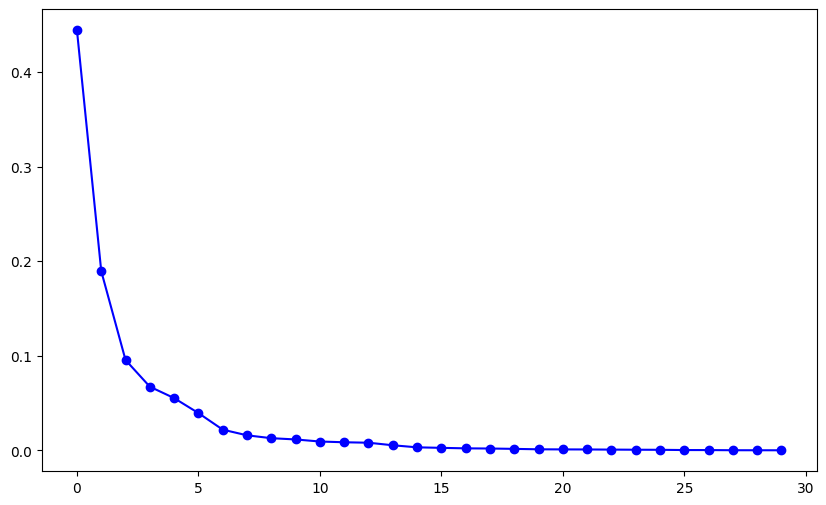

In [24]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train)

plt.figure(figsize=(10,6))
plt.plot(pca.explained_variance_ratio_,'bo-')
plt.show()

- Porcentaje de la varianza a tomar en cuenta. Este dato se entrega en el entrenamiento.
    - Ej. Si deseamos las componentes que contienen el 95% de la varianza, entrenamos el algoritmo PCA como se ve a continuación

In [27]:
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train)

print("El número de componentes es", pca.n_components_, "de", pca.n_features_)

El número de componentes es 10 de 30


# Ejemplo de uso PCA: eigenfaces

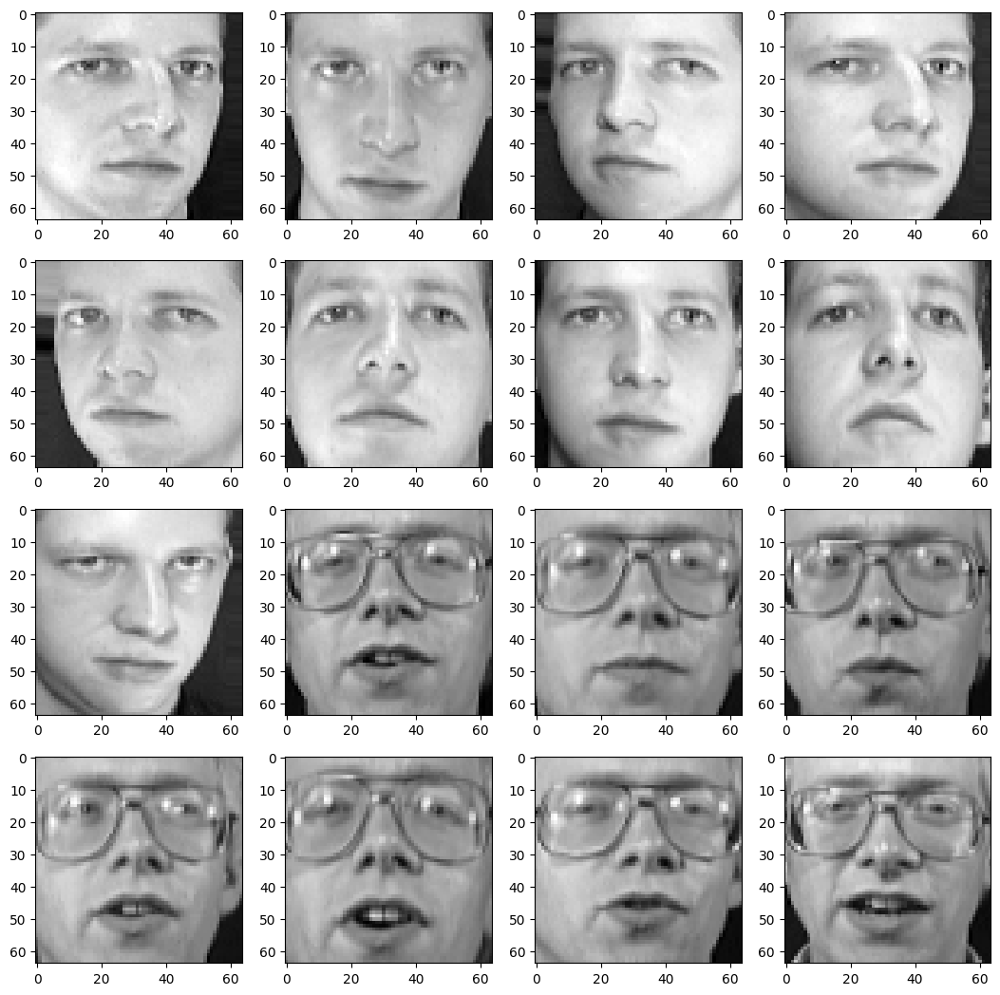

(400, 4096)


In [28]:
from sklearn.datasets import fetch_olivetti_faces

faces = fetch_olivetti_faces()
X = faces.data
y = faces.target

fig = plt.figure(figsize=(13,13))

# Código para visualizar algunas de las imágenes (16 imágenes)
n = 16
for i in range(1,n+1):
    ax = fig.add_subplot(4,4,i)
    ax.imshow(X[i].reshape(64,64), cmap='gray')

plt.show()
print(X.shape)

In [29]:
from sklearn.decomposition import PCA

pca = PCA()
pcs = pca.fit_transform(X)

pca.components_.shape

(400, 4096)

In [30]:
pca.singular_values_

array([8.67019577e+01, 6.64652710e+01, 5.01551476e+01, 3.97224846e+01,
       3.37574005e+01, 3.15687122e+01, 2.76786079e+01, 2.53545265e+01,
       2.48624096e+01, 2.29751472e+01, 2.24406338e+01, 2.12985153e+01,
       1.98386726e+01, 1.90296783e+01, 1.83174934e+01, 1.75683689e+01,
       1.70332031e+01, 1.60455990e+01, 1.54267349e+01, 1.53560781e+01,
       1.48501778e+01, 1.39293404e+01, 1.35770016e+01, 1.34108400e+01,
       1.31309595e+01, 1.29574909e+01, 1.27358570e+01, 1.25111065e+01,
       1.20198126e+01, 1.18014069e+01, 1.12651825e+01, 1.10127850e+01,
       1.06892967e+01, 1.02766123e+01, 1.00567465e+01, 9.98839760e+00,
       9.81474686e+00, 9.70944500e+00, 9.43750954e+00, 9.30046654e+00,
       9.05566883e+00, 8.95432568e+00, 8.78629208e+00, 8.70131111e+00,
       8.53743076e+00, 8.45436382e+00, 8.37684822e+00, 8.34204102e+00,
       8.12110806e+00, 8.04420948e+00, 7.88286638e+00, 7.77384663e+00,
       7.64300632e+00, 7.51582718e+00, 7.48782682e+00, 7.37899303e+00,
      

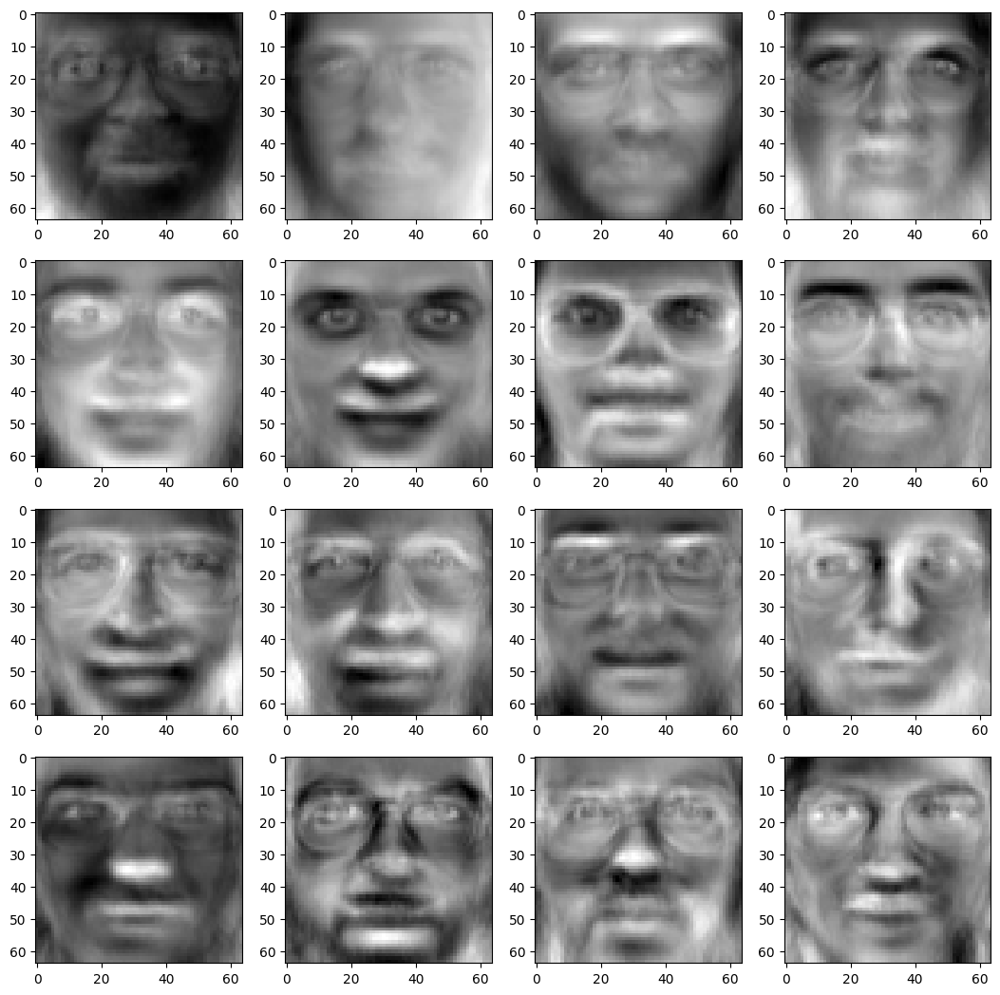

In [31]:
fig = plt.figure(figsize=(13,13))

# Gráfico de algunas de las primeras componentes principales 
# como imágenes (las primeras 16)
n = 16
for i in range(0,n):
    ax = fig.add_subplot(4,4,i+1)
    ax.imshow(pca.components_[i].reshape(64,64), cmap='gray')

plt.show()

# Linear Discriminant Analysis (LDA)

- Es un algoritmo de clasificación, que aprende los ejes más discriminativos entre clases.
- La proyección resultante mantiene las clases tan separadas como sea posible.

In [1]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
import pandas as pd

cancer_data = load_breast_cancer(as_frame=True) # Para obtener datos como dataframe
print(cancer_data.target_names) # 0 Maligno, 1 benigno

['malignant' 'benign']


In [2]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

X = cancer_data.data
y = cancer_data.target

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2, stratify=y)

# Instanciar Escalador Estándar
scaler = StandardScaler()
# Ajustar y transformar datos
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [3]:
lda = LinearDiscriminantAnalysis()
X_train_lda = lda.fit_transform(X_train, y_train)
lda.score(X_test, y_test)

0.956140350877193

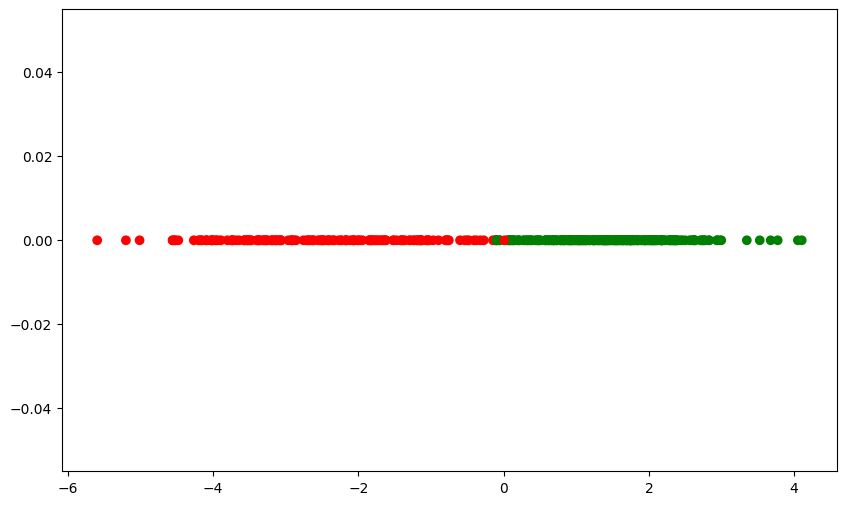

In [4]:
# Proyectando
colors = {0:'red', 1:'green'}
color_map = y_train.map(colors)

plt.figure(figsize=(10,6))
plt.scatter(X_train_lda,np.zeros_like(X_train_lda), c=color_map)
plt.show()

# Actividad 8

¡Hora de poner en práctica todo lo aprendido hasta ahora!

- Estudie el dataset California Housing presente en los dataset de Scikit-Learn (enlace [aquí](https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset))
- Cree un Pipeline completo que permita predecir el precio de una casa.
- Utilice un algoritmo de reducción de dimensionalidad y utilice las nuevas componentes para predecir el precio. Compare sus resultados con su pipeline original.

In [ ]:
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")
#codigo extra, para que imagenes de matplotlib
#estén centradas en las diapositivas, ejecutar antes de lanzar los ejemplos.